🤗 Transformers provides APIs and tools to easily download and train state-of-the-art pretrained models. Using pretrained models can reduce your compute costs, carbon footprint, and save you the time and resources required to train a model from scratch. These models support common tasks in different modalities, such as:

- 📝 Natural Language Processing: text classification, named entity recognition, question answering, language modeling, summarization, translation, multiple choice, and text generation.

- 🖼️ Computer Vision: image classification, object detection, and segmentation.

- 🗣️ Audio: automatic speech recognition and audio classification.

- 🐙 Multimodal: table question answering, optical character recognition, information extraction from scanned documents, video classification, and visual question answering.

In [1]:
!pip install transformers datasets evaluate accelerate sentencepiece pytesseract

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.4/491.4 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 49.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 40.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

# Pipelines for inference

The pipeline() makes it simple to use any model from the Hub for inference on any language, computer vision, speech, and multimodal tasks. Even if you don’t have experience with a specific modality or aren’t familiar with the underlying code behind the models, you can still use them for inference with the pipeline()!

## Text classification

In [2]:
from transformers import pipeline
pipe = pipeline("text-classification")
pipe("This restaurant is just ok")

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision 714eb0f (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

Device set to use cpu


[{'label': 'POSITIVE', 'score': 0.9998499155044556}]

We can load the dataset directly

Then take a look at an example:

In [3]:
from datasets import load_dataset

imdb = load_dataset("stanfordnlp/imdb")
imdb["test"][100]

README.md:   0%|          | 0.00/7.81k [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/21.0M [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/20.5M [00:00<?, ?B/s]

unsupervised-00000-of-00001.parquet:   0%|          | 0.00/42.0M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating unsupervised split:   0%|          | 0/50000 [00:00<?, ? examples/s]

{'text': '"Cover Girl" is a lacklustre WWII musical with absolutely nothing memorable about it, save for its signature song, "Long Ago and Far Away." This film came out before Gene Kelly really hit his artistic stride, and while there are evidences of his burgeoning talent here, mostly he plays sidekick to Rita Hayworth. And there\'s the problem. Rita Hayworth is gorgeous, no doubt about that. But she\'s simply not a compelling screen presence. I\'ve always found myself wanting to like her more than I actually do, and this movie is no exception. She\'s simply not a very good actress, and she\'s not even a very good dancer. Good looking as she is, there\'s something vapid about her, and this movie suffers because of it.<br /><br />Grade: C-',
 'label': 0}

There are two fields in this dataset:

text: the movie review text.

label: a value that is either 0 for a negative review or 1 for a positive review.

In [4]:
# Load model and tokenizer
from transformers import AutoModelForSequenceClassification, AutoTokenizer

model = AutoModelForSequenceClassification.from_pretrained("google-bert/bert-base-uncased")
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at google-bert/bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [5]:
pipe = pipeline("text-classification", model=model, tokenizer=tokenizer)
pipe(imdb["test"][100]['text'])

Device set to use cpu


[{'label': 'LABEL_0', 'score': 0.5978938341140747}]

In [6]:
pipe("This restaurant is just ok")

[{'label': 'LABEL_0', 'score': 0.5841192603111267}]

Including a metric during training is often helpful for evaluating your model’s performance.

In [7]:
import evaluate
from evaluate import evaluator

accuracy = evaluate.load("accuracy")

task_evaluator = evaluator("text-classification")

data = load_dataset("imdb", split="test").shuffle(seed=42).select(range(1000))

results = task_evaluator.compute(model_or_pipeline=pipe, data=data, metric=accuracy,
                       label_mapping={"LABEL_0": 0, "LABEL_1": 1})

print(results)

README.md:   0%|          | 0.00/7.81k [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/21.0M [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/20.5M [00:00<?, ?B/s]

unsupervised-00000-of-00001.parquet:   0%|          | 0.00/42.0M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating unsupervised split:   0%|          | 0/50000 [00:00<?, ? examples/s]

{'accuracy': 0.512, 'total_time_in_seconds': 614.032943487, 'samples_per_second': 1.628577115620461, 'latency_in_seconds': 0.614032943487}


In [8]:
task_evaluator = evaluator("sentiment-analysis")
pipe_imdb = pipeline("sentiment-analysis", model="saiffff/distilbert-imdb-sentiment")
pipe_imdb(imdb["test"][100]['text'])

config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.25k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/695 [00:00<?, ?B/s]

Device set to use cpu


[{'label': 'LABEL_0', 'score': 0.9873145818710327}]

In [9]:
results = task_evaluator.compute(model_or_pipeline=pipe_imdb, data=data, metric=accuracy,
                       label_mapping={"LABEL_0": 0, "LABEL_1": 1})
print(results)

{'accuracy': 0.921, 'total_time_in_seconds': 305.982965335, 'samples_per_second': 3.268155790650528, 'latency_in_seconds': 0.305982965335}


### Sentiment in other languages

In [10]:
pipe("Gosto muito de Redes Neurais e Aprendizado Profundo")

[{'label': 'LABEL_0', 'score': 0.6254981756210327}]

In [11]:
pipe_portuguese = pipeline("sentiment-analysis", model='lps08/bert-base-portuguese-cased-editals', device=0)
pipe_portuguese("Gosto muito de Redes Neurais e Aprendizado Profundo")

config.json:   0%|          | 0.00/926 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/436M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.29k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/210k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

Device set to use cpu


[{'label': 'LABEL_1', 'score': 0.5986764430999756}]

### Translation ✍️



In [12]:
en_pt_pipe = pipeline("translation", model="Helsinki-NLP/opus-mt-tc-big-en-pt")
en_pt_pipe("This is a test of how well this model works")

config.json:   0%|          | 0.00/1.08k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/465M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/301 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/337 [00:00<?, ?B/s]

source.spm:   0%|          | 0.00/803k [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/825k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.38M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/65.0 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/transformers/models/marian/tokenization_marian.py:175: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")
Device set to use cpu


[{'translation_text': 'Este é um teste de quão bem este modelo funciona'}]

In [13]:
text = "Nova School of Business & Economics (Nova SBE) is a business school located in Portugal that offers a wide range of academic programs including Bachelor's, Master's, Ph.D., MBA, Executive Education programs. The school has approximately 3,000 students from over 70 different countries. Its programs have received recognition from various academic rankings, such as the Financial Times Ranking,[1] The Economist,[2] Eduniversal,[3] Times Higher Education[4] and QS World Rankings.[5]"
en_pt_pipe(text)

[{'translation_text': 'Nova SBE é uma escola de negócios localizada em Portugal que oferece uma ampla gama de programas acadêmicos, incluindo bacharelado, mestrado, doutorado, MBA, programas de educação executiva. A escola tem aproximadamente 3.000 alunos de mais de 70 países diferentes. Seus programas receberam reconhecimento de vários rankings acadêmicos, como o Financial Times Ranking,[1] The Economist,[2] Eduniversal,[3] Times Higher Education[4] e QS World Rankings.[5]'}]

### Summarization

Another really useful NLP task is summarizing a large amount of information into a very small amount of words. BART is a model that performs well on tasks like summarization; it contains a combination of two models - the BERT model and and autogressive style GPT model - check out this link for some more information on it.

Since BART models can be quite large, try to find the distilbart-xsum-12-6 model on HuggingFace which is one of the smallest distillations available. Integrate that model into a "summarization" pipeline, then take some text (e.g. perhaps by copy-pasting or scraping from a BBC article) and summarize it with your pipeline!

In [14]:
summary_pipe = pipeline("summarization", model="sshleifer/distilbart-xsum-12-6")

summary_pipe(text)

config.json:   0%|          | 0.00/1.59k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/611M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/611M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

Device set to use cpu


[{'summary_text': " The Nova School of Business & Economics is one of the world's leading business schools."}]

### Question Answering 🔍

In [15]:
# $CHALLENGIFY_BEGIN
questions_pipe = pipeline("question-answering", model="deepset/roberta-base-squad2")
questions_pipe(
    question = "Where is Nova SBE?",
    context = text
)

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/496M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/79.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/772 [00:00<?, ?B/s]

Device set to use cpu


{'score': 0.9760395884513855, 'start': 79, 'end': 87, 'answer': 'Portugal'}

### Image classfication: Cat or Dog?



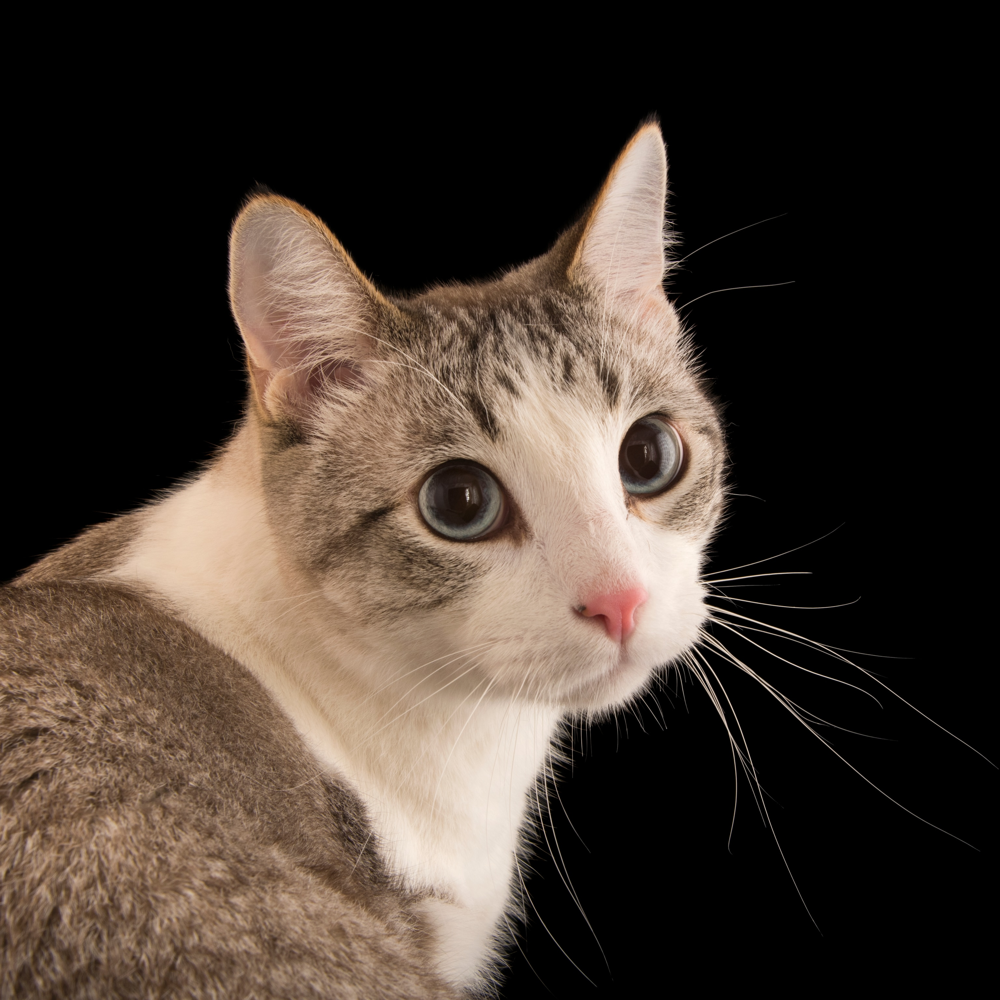

In [16]:
import requests
from PIL import Image

url = "https://i.natgeofe.com/n/548467d8-c5f1-4551-9f58-6817a8d2c45e/NationalGeographic_2572187_square.jpg"
image = Image.open(requests.get(url, stream=True).raw)
image

In [17]:
from transformers import pipeline
clf = pipeline("image-classification")
clf(image)

No model was supplied, defaulted to google/vit-base-patch16-224 and revision 3f49326 (https://huggingface.co/google/vit-base-patch16-224).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Device set to use cpu


[{'label': 'Egyptian cat', 'score': 0.6481267213821411},
 {'label': 'tiger cat', 'score': 0.19065867364406586},
 {'label': 'tabby, tabby cat', 'score': 0.1170494556427002},
 {'label': 'lynx, catamount', 'score': 0.013973785564303398},
 {'label': 'Siamese cat, Siamese', 'score': 0.0016689554322510958}]

### Image Segmentation

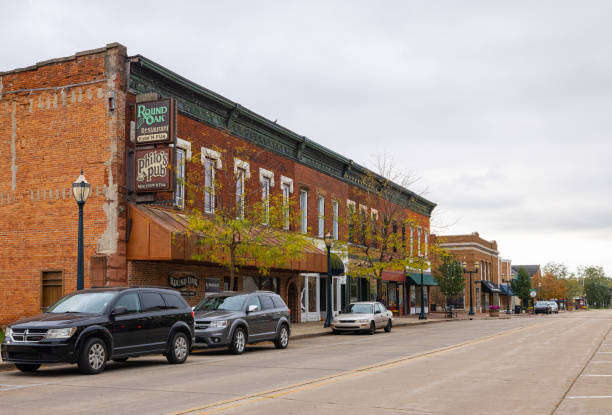

In [18]:


url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/segmentation_input.jpg"
image = Image.open(requests.get(url, stream=True).raw)
image

In [19]:
semantic_segmentation = pipeline("image-segmentation", "nvidia/segformer-b1-finetuned-cityscapes-1024-1024")
results = semantic_segmentation(image)
results

config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/54.8M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/273 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
Device set to use cpu


model.safetensors:   0%|          | 0.00/54.8M [00:00<?, ?B/s]

[{'score': None,
  'label': 'road',
  'mask': <PIL.Image.Image image mode=L size=612x415>},
 {'score': None,
  'label': 'sidewalk',
  'mask': <PIL.Image.Image image mode=L size=612x415>},
 {'score': None,
  'label': 'building',
  'mask': <PIL.Image.Image image mode=L size=612x415>},
 {'score': None,
  'label': 'wall',
  'mask': <PIL.Image.Image image mode=L size=612x415>},
 {'score': None,
  'label': 'pole',
  'mask': <PIL.Image.Image image mode=L size=612x415>},
 {'score': None,
  'label': 'traffic sign',
  'mask': <PIL.Image.Image image mode=L size=612x415>},
 {'score': None,
  'label': 'vegetation',
  'mask': <PIL.Image.Image image mode=L size=612x415>},
 {'score': None,
  'label': 'terrain',
  'mask': <PIL.Image.Image image mode=L size=612x415>},
 {'score': None,
  'label': 'sky',
  'mask': <PIL.Image.Image image mode=L size=612x415>},
 {'score': None,
  'label': 'car',
  'mask': <PIL.Image.Image image mode=L size=612x415>}]

Taking a look at the mask for the car class, we can see every car is classified with the same mask.

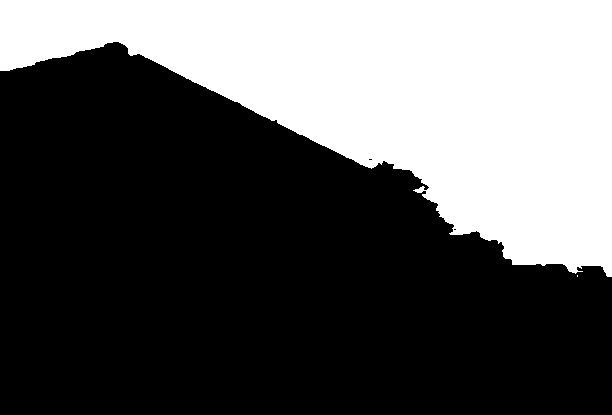

In [20]:
results[-2]["mask"]

# Generative AI

In this part, we will use Google's Gemini (https://blog.google/technology/ai/google-gemini-ai/#sundar-note), a family of multimodal large language models developed by Google DeepMind. Now Google provide Gemini API to allow you to explore the Generative AI for free!

In order to use the service, you need to register for Gemini API from Google AI studio: (https://makersuite.google.com/app/apikey). You can click Create API key for new project in order to get the key. Then, you may copy/paste the API key to the Google Colab Secrets on the left bar (you should see a key symbol). Fill in Name as GOOGLE_API_KEY and Value as your key. Enable the Notebook access and restart the colab. Then you should be good to go run the following code. Note that you only need to configure this for once. If you encountered error later such as "Secret not found", you need to check whether you have configured key correctly or not.

In [21]:
!pip install -q -U google-generativeai
import textwrap


import google.generativeai as genai

from IPython.display import display
from IPython.display import Markdown


def to_markdown(text):
  text = text.replace('•', '  *')
  return Markdown(textwrap.indent(text, '> ', predicate=lambda _: True))

For the following tasks i changed the model to gemini flash 2.0 because the pro was outdated

In [25]:
#@title Configure Gemini API key

#Access your Gemini API key

import google.generativeai as genai
from google.colab import userdata

gemini_api_secret_name = 'GOOGLE_API_KEY'  # @param {type: "string"}

try:
  GOOGLE_API_KEY=userdata.get(gemini_api_secret_name)
  genai.configure(api_key=GOOGLE_API_KEY)
except userdata.SecretNotFoundError as e:
   print(f'Secret not found\n\nThis expects you to create a secret named {gemini_api_secret_name} in Colab\n\nVisit https://makersuite.google.com/app/apikey to create an API key\n\nStore that in the secrets section on the left side of the notebook (key icon)\n\nName the secret {gemini_api_secret_name}')
   raise e
except userdata.NotebookAccessError as e:
  print(f'You need to grant this notebook access to the {gemini_api_secret_name} secret in order for the notebook to access Gemini on your behalf.')
  raise e
except Exception as e:
  # unknown error
  print(f"There was an unknown error. Ensure you have a secret {gemini_api_secret_name} stored in Colab and it's a valid key from https://makersuite.google.com/app/apikey")
  raise e

model = genai.GenerativeModel(model_name="models/gemini-2.0-flash")

In [26]:
response = model.generate_content("What is the meaning of life?")

In [27]:
to_markdown(response.text)

> Ah, the big question! The meaning of life is one of those questions that has plagued philosophers, theologians, and individuals for centuries. There's no single, universally accepted answer, and that's kind of the point. Here's a breakdown of different perspectives:
> 
> **1. Absurdist/Nihilist View:**
> 
> *   **Meaninglessness:** Life has no inherent meaning or purpose. We are born into a chaotic, indifferent universe and our existence is ultimately insignificant.
> *   **Freedom and Responsibility:** Since there's no pre-ordained purpose, we are free to create our own meaning and values. This freedom comes with the responsibility to define our own lives.
> *   **Acceptance and Rebellion:** Absurdists often advocate for accepting the absurdity of life and rebelling against it by living authentically and embracing the present moment.
> *   **Key Thinkers:** Albert Camus, Jean-Paul Sartre
> 
> **2. Existentialist View:**
> 
> *   **Existence Precedes Essence:** We are born into existence *without* a predetermined essence or nature. We define ourselves through our choices and actions.
> *   **Meaning is Created:** Meaning is not found, but created. We are responsible for crafting our own purpose and values.
> *   **Authenticity:** Living in accordance with one's own values and beliefs, rather than conforming to societal expectations.
> *   **Angst and Responsibility:** The freedom to create our own meaning can be overwhelming and lead to existential angst.
> *   **Key Thinkers:** Jean-Paul Sartre, Simone de Beauvoir
> 
> **3. Hedonistic View:**
> 
> *   **Pleasure and Happiness:** The meaning of life is to maximize pleasure and minimize pain. This can involve seeking sensory pleasures, intellectual stimulation, or emotional fulfillment.
> *   **Different Types of Pleasure:** Some hedonists focus on short-term gratification, while others emphasize long-term happiness and well-being.
> *   **Criticisms:** Can be seen as shallow or self-centered, potentially leading to harmful behaviors.
> 
> **4. Purpose-Driven View:**
> 
> *   **Finding Your Purpose:** Life has meaning when you discover and pursue your purpose, whether it's helping others, creating art, advancing knowledge, or achieving a specific goal.
> *   **Contributing to Something Larger:** Finding meaning by contributing to something larger than oneself, such as a community, a cause, or future generations.
> *   **Meaning Through Work:** For some, purpose is found in their work, while for others, it lies in their passions and hobbies.
> 
> **5. Religious/Spiritual Views:**
> 
> *   **Divine Purpose:** Life has meaning as part of a divine plan or purpose set by a higher power.
> *   **Serving God/Higher Power:** Meaning is found in serving God, following religious teachings, and living a virtuous life.
> *   **Afterlife:** The meaning of life may be tied to achieving salvation or enlightenment and experiencing a positive afterlife.
> *   **Examples:** Christianity, Islam, Buddhism, Hinduism
> 
> **6. Humanistic View:**
> 
> *   **Human Potential:** The meaning of life is to develop one's full potential as a human being, including intellectual, emotional, and moral growth.
> *   **Relationships and Connection:** Meaning is found in building meaningful relationships with others and contributing to the well-being of humanity.
> *   **Ethical Living:** Living a life guided by compassion, empathy, and a commitment to social justice.
> 
> **7. Stoic View:**
> 
> *   **Virtue and Reason:** Finding meaning through living a virtuous life guided by reason, wisdom, justice, courage, and temperance.
> *   **Acceptance of What We Cannot Control:** Focusing on what we can control (our thoughts and actions) and accepting what we cannot (external events).
> *   **Inner Peace:** Achieving inner peace and tranquility by living in accordance with nature and accepting the natural order of things.
> *   **Key Thinkers:** Marcus Aurelius, Epictetus
> 
> **In Summary:**
> 
> The meaning of life is a deeply personal and subjective question. There is no right or wrong answer. It's up to each individual to explore these different perspectives, reflect on their own values and experiences, and create their own meaning.  Here are some questions to consider when formulating your own answer:
> 
> *   **What brings you joy and fulfillment?**
> *   **What are you passionate about?**
> *   **What kind of impact do you want to have on the world?**
> *   **What values are most important to you?**
> *   **What do you believe in?**
> 
> Ultimately, the search for meaning is a lifelong journey, and the answer may evolve over time as you grow and change.


## Generate text from image and text inputs

Gemini provides a multimodal model (`gemini-pro-vision`) that accepts both text and images and inputs. The `GenerativeModel.generate_content` API is designed to handle multimodal prompts and returns a text output.

Let's include an image:

In [28]:
!curl -o image.jpg https://t0.gstatic.com/licensed-image?q=tbn:ANd9GcQ_Kevbk21QBRy-PgB4kQpS79brbmmEG7m3VOTShAn4PecDU5H5UxrJxE3Dw1JiaG17V88QIol19-3TM2wCHw

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  405k  100  405k    0     0  1621k      0 --:--:-- --:--:-- --:--:-- 1626k


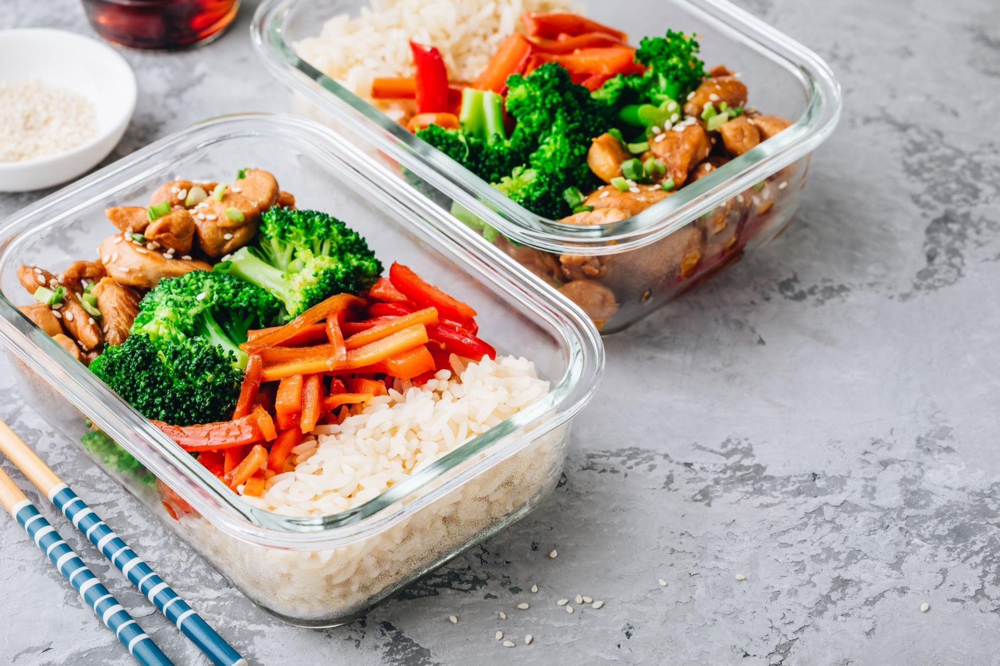

In [29]:
import PIL.Image

img = PIL.Image.open('image.jpg')
img

Use the `gemini-pro-vision` model and pass the image to the model with `generate_content`.

In [30]:
model = genai.GenerativeModel('gemini-1.5-flash')

In [31]:
response = model.generate_content(["Describe this image", img])

to_markdown(response.text)

> Here's a description of the image:
> 
> High-angle, close-up view of two glass food containers filled with a similar meal. 
> 
> 
> Each container holds a portion of cooked brown rice, pieces of teriyaki chicken (or a similar glazed chicken), steamed broccoli florets, and sliced bell peppers (red and orange). The chicken appears to be lightly sprinkled with sesame seeds and possibly green onions. The containers are transparent, allowing a clear view of the food's contents.
> 
> 
> The containers rest on a mottled gray surface, which seems to be a countertop or table.  A small, shallow white bowl containing sesame seeds is visible in the background, along with a partially visible dark-colored bottle (possibly soy sauce). A pair of wooden chopsticks with blue and white stripes are also visible in the bottom left corner. The overall impression is of healthy, prepared meals, possibly meal prep for lunch or dinner.  Some stray sesame seeds are scattered on the table near the containers.


To provide both text and images in a prompt, pass a list containing the strings and images:

In [32]:
response = model.generate_content(["Write a short, engaging blog post based on this picture. It should include a description of the meal in the photo and talk about my journey meal prepping.", img], stream=True)
response.resolve()

In [33]:
to_markdown(response.text)

> ## My Meal Prep Journey: From Chaos to Teriyaki Chicken Bliss!
> 
> Let's be honest, meal prepping used to feel like a monumental task.  My

## Chat conversations

Gemini enables you to have freeform conversations across multiple turns. The `ChatSession` class simplifies the process by managing the state of the conversation, so unlike with `generate_content`, you do not have to store the conversation history as a list.

Initialize the chat:

In [37]:
model = genai.GenerativeModel(model_name="models/gemini-2.0-flash")
chat = model.start_chat(history=[])
chat

ChatSession(
    model=genai.GenerativeModel(
        model_name='models/gemini-2.0-flash',
        generation_config={},
        safety_settings={},
        tools=None,
        system_instruction=None,
        cached_content=None
    ),
    history=[]
)

The `ChatSession.send_message` method returns the same `GenerateContentResponse` type as `GenerativeModel.generate_content`. It also appends your message and the response to the chat history:

In [38]:
response = chat.send_message("In one sentence, explain how a computer works to a young child.")
to_markdown(response.text)

> A computer is like a super-smart toy that follows instructions to do things like show pictures, play games, and help you learn!


In [39]:
response = chat.send_message("Okay, how about a more detailed explanation to a high schooler?", stream=True)

for chunk in response:
  print(chunk.text)
  print("_"*80)

A
________________________________________________________________________________
 computer fundamentally
________________________________________________________________________________
 operates by executing instructions at the machine code level, manipulating data stored in memory according
________________________________________________________________________________
 to those instructions, ultimately translating complex algorithms and user input into electronic signals that control
________________________________________________________________________________
 hardware components to perform tasks ranging from simple calculations to complex simulations and information retrieval.

________________________________________________________________________________


### Multi-turn conversations

While the `genai.ChatSession` class shown earlier can handle many use cases, it does make some assumptions. If your use case doesn't fit into this chat implementation it's good to remember that `genai.ChatSession` is just a wrapper around `GenerativeModel.generate_content`. In addition to single requests, it can handle multi-turn conversations.

The individual messages are `glm.Content` objects or compatible dictionaries, as seen in previous sections. As a dictionary, the message requires `role` and `parts` keys. The `role` in a conversation can either be the `user`, which provides the prompts, or `model`, which provides the responses.

Pass a list of `glm.Content` objects and it will be treated as multi-turn chat:

In [40]:
messages = [
    {'role':'user',
     'parts': ["Briefly explain how a computer works to a young child."]}
]
response = model.generate_content(messages)

to_markdown(response.text)

> Imagine a computer is like a super-smart toy robot!
> 
> You tell it what to do by pressing buttons or tapping the screen. These are like giving the robot instructions.
> 
> Inside the robot, there's a tiny brain called the processor.  The brain follows your instructions, like adding numbers or showing you a picture.
> 
> The computer also has a memory, like your brain, where it keeps information so it doesn't forget!
> 
> Finally, the screen is like a window where the robot shows you the results of what it's doing.  So, you tell it what to do, it thinks, remembers, and then shows you the answer!


To continue the conversation, add the response and another message.

In [41]:
messages.append({'role':'model',
                 'parts':[response.text]})

messages.append({'role':'user',
                 'parts':["Okay, how about a more detailed explanation to a high school student?"]})

response = model.generate_content(messages)

to_markdown(response.text)

> Okay, here's a more detailed explanation of how a computer works, suitable for a high school student:
> 
> A computer, at its core, is a system that processes information. It functions through a coordinated interaction of hardware and software. Here's a breakdown:
> 
> **1. Hardware:** These are the physical components:
> 
> *   **Central Processing Unit (CPU):** The "brain" of the computer. It executes instructions in a cycle: Fetch, Decode, Execute.
>     *   **Fetch:** Retrieves an instruction from memory.
>     *   **Decode:** Interprets the instruction to determine what operation needs to be performed.
>     *   **Execute:** Performs the operation, which can be arithmetic, logical, or control-related.
>     *   Modern CPUs have multiple cores, allowing them to execute multiple instructions simultaneously (parallel processing).  They also utilize techniques like pipelining and branch prediction to increase efficiency.
> *   **Memory (RAM):** Random Access Memory. This is volatile memory used for temporary storage of data and instructions that the CPU is actively using.  Data is lost when power is turned off. The amount of RAM significantly impacts performance; more RAM allows the CPU to access more data quickly, reducing reliance on slower storage.
> *   **Storage (Hard Drive/SSD):**  Non-volatile memory used for long-term storage of data, programs, and the operating system.
>     *   **Hard Disk Drives (HDDs):** Use spinning platters and read/write heads. Slower than SSDs.
>     *   **Solid State Drives (SSDs):** Use flash memory (like USB drives). Much faster, more durable, and consume less power.
> *   **Input Devices:** Allow users to provide input to the computer (e.g., keyboard, mouse, microphone).
> *   **Output Devices:** Allow the computer to display or transmit information to the user (e.g., monitor, printer, speakers).
> *   **Motherboard:** The main circuit board that connects all the components together. It provides pathways (buses) for communication between the CPU, memory, storage, and peripherals.
> *   **Graphics Processing Unit (GPU):** Specialized processor for handling graphics and image processing. It offloads these tasks from the CPU, improving performance for gaming, video editing, and other graphically intensive applications.
> 
> **2. Software:** These are the programs and instructions that tell the hardware what to do:
> 
> *   **Operating System (OS):** The fundamental software that manages the computer's hardware and software resources. Examples: Windows, macOS, Linux. It provides a user interface, manages files, controls peripherals, and allocates memory.
> *   **Applications:** Programs designed to perform specific tasks (e.g., web browser, word processor, game). They rely on the OS to interact with the hardware.
> *   **Firmware:** Low-level software embedded in hardware devices (e.g., BIOS/UEFI in the motherboard, firmware in a hard drive). It provides basic instructions for the hardware to function.
> 
> **3. How it all works together:**
> 
> 1.  **Input:** The user provides input via an input device.
> 2.  **Processing:** The CPU fetches instructions from RAM, decodes them, and executes them. Data is manipulated according to these instructions. The GPU handles graphics-related computations.
> 3.  **Memory Access:** The CPU accesses data and instructions stored in RAM. If the data isn't in RAM, it might need to be retrieved from slower storage (HDD/SSD).
> 4.  **Output:** The processed information is sent to an output device, displaying the results to the user.
> 5.  **Operating System Management:** The OS manages all these processes, ensuring that resources are allocated efficiently and that different applications don't interfere with each other.
> 
> **Key Concepts:**
> 
> *   **Binary Code:** Computers use binary code (0s and 1s) to represent all data and instructions.
> *   **Algorithms:** A step-by-step procedure for solving a problem. Software is built upon algorithms.
> *   **Data Structures:** Ways of organizing and storing data in a computer so that it can be used efficiently.
> *   **Networking:** Computers can communicate with each other over networks, allowing them to share information and resources.
> *   **Abstraction:** Complex systems are broken down into simpler, more manageable levels of abstraction. This allows programmers to focus on higher-level tasks without needing to understand the low-level details of the hardware.
> 
> **In Summary:** A computer is a complex system that takes input, processes it according to instructions (software) using its hardware components (CPU, memory, storage, etc.), and produces output. The operating system acts as the manager, ensuring that everything works together smoothly. The speed and efficiency of each component, along with the effectiveness of the software, determine the overall performance of the computer.
